# Exploration of hormonal receptor genes in He et al. organoid atlas dataset - HNOCA extended dataset - Metacell calculation by SeaCells - Data Preparation

[Reference paper](https://www.nature.com/articles/s41586-024-08172-8)

These are the filterings done on the adata available in cellxgene. Done in 1.notebook SubsetHNOCA.ipynb 

- authors_keep = [
    "Esk, 2020",
    "Pellegrini, 2020",
    "Velasco, 2019",
    "Pasca, 2015",
    "Trujillo, 2019",
    "Yoon, 2019",
    "Qian, 2020",
    "Bhaduri, 2020",
    "Birey, 2017"
]; 
mask_author = adata_complete.obs["assay_differentiation"].str.contains("|".join(authors_keep), na=False)
- mask_age = adata_complete.obs["organoid_age_days"] <= 50

-----

# 1. Environment

## 1.1 Modules

In [1]:
import os
import sys

import numpy as np
import pandas as pd
import scanpy as sc

import pickle

#Plotting
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

#utils
#import ipynbname
from datetime import datetime

# SeaCell
import SEACells

#import custom functions
sys.path.append('../')
import functions as fn

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [2]:
# Some plotting aesthetics
%matplotlib inline

sns.set_style('ticks')
matplotlib.rcParams['figure.figsize'] = [3.5, 3.5]
matplotlib.rcParams['figure.dpi'] = 100

In [3]:
print("Scanpy version: ", sc.__version__)
print("Pandas version: ", pd.__version__)
print("SEACell version: ", SEACells.__version__)

Scanpy version:  1.9.3
Pandas version:  2.0.0
SEACell version:  0.3.3


## 1.2 Settings


In [4]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)

## 1.3 Files and parameters

In [46]:
input_file = '../../../../DataDir/ExternalData/SingleCellData/HNOCA_adata_processed.h5ad'
output_file = '../../../../DataDir/ExternalData/SingleCellData/HNOCA_adata_downsampledForMetacells.h5ad'

## 1.4 Start computations

In [6]:
print(datetime.now())

2026-04-16 13:02:27.097130


----

# 2. Data Load


## 2.1 Read adata file

In [7]:
adata = sc.read(input_file)

In [8]:
adata

AnnData object with n_obs × n_vars = 336027 × 35725
    obs: 'assay_differentiation', 'assay_type_differentiation', 'bio_sample', 'cell_line', 'cell_type_original', 'gm', 'id', 'individual', 'state_exact', 'suspension_type', 'tech_sample', 'treatment', 'organoid_age_days', 'publication', 'doi', 'batch', 'annot_level_1', 'annot_level_2', 'annot_level_3_rev2', 'annot_level_4_rev2', 'annot_region_rev2', 'annot_ntt_rev2', 'Hallmark_Glycolysis', 'hnoca_core', 'annot_level_2_extended', 'tissue_type', 'sex_ontology_term_id', 'donor_id', 'assay_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'disease_ontology_term_id', 'development_stage_ontology_term_id', 'cell_type_ontology_term_id', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'gene_length', 'highly_variable', 'highly_variable_rank', 'highly_variable_nbatches', 'feature_is_filtered', 'feature_name',

In [9]:
adata.obsm

AxisArrays with keys: X_draw_graph_fa_harmony, X_pca, X_pca_harmony, X_scpoli, X_umap_harmony, X_umap_nocorr, X_umap_scpoli

In [10]:
adata.X

<336027x35725 sparse matrix of type '<class 'numpy.float32'>'
	with 622441202 stored elements in Compressed Sparse Row format>

In [11]:
print(adata.X[40:45, 40:45])

  (2, 4)	2.0983953


In [12]:
adata.obs['assay_differentiation'].value_counts()

assay_differentiation
Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)                   277411
Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); most directed     28522
Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); directed          13272
Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hChPO             9637
Trujillo, 2019 (doi: 10.1016/j.stem.2019.08.002)                   4427
Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hCO               2758
Name: count, dtype: int64

In [13]:
adata.obs['organoid_age_days'].value_counts()

organoid_age_days
35    148509
21     35845
23     27356
28     23047
36     20368
47     17374
32     17265
45     16976
38     15223
46      5690
30      4427
27      3947
Name: count, dtype: int64

In [14]:
adata.obs['organoid_age_days'] = pd.Categorical(
    adata.obs['organoid_age_days'],
    categories=sorted(adata.obs['organoid_age_days'].unique()),
    ordered=True
)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


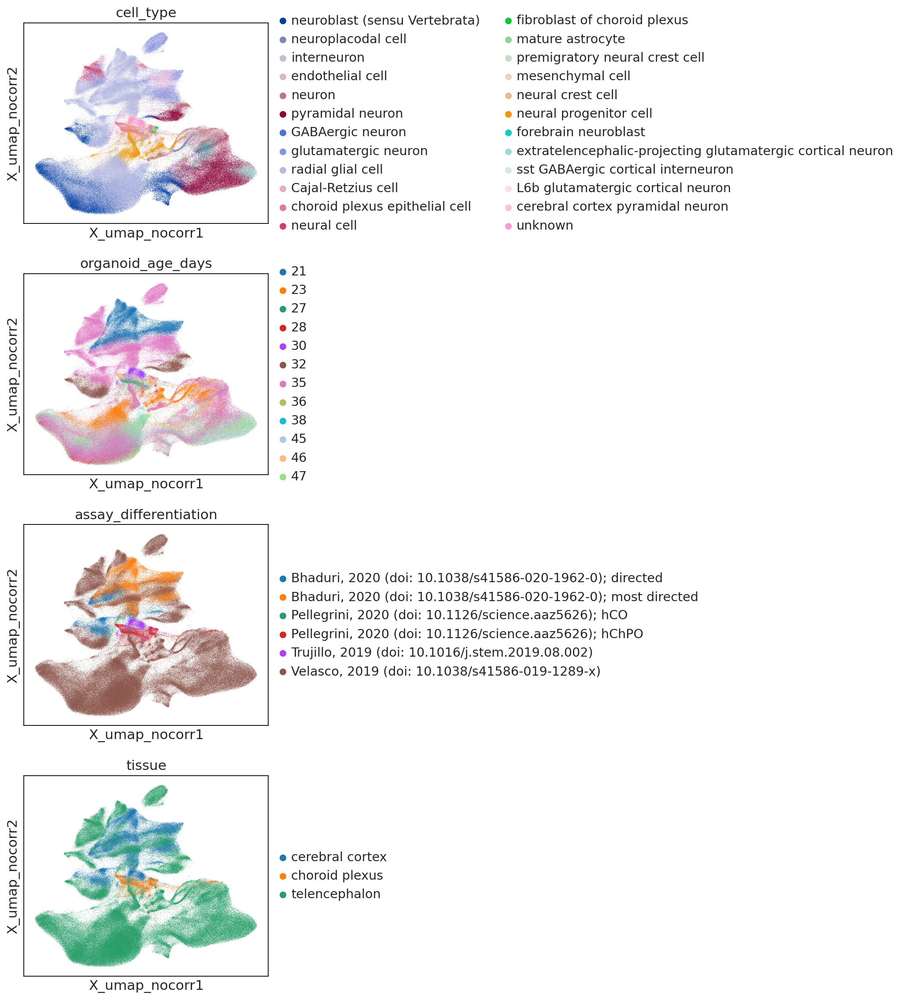

In [15]:
sc.pl.embedding(adata,  basis="X_umap_nocorr", color=['cell_type', 'organoid_age_days', 'assay_differentiation', 'tissue'], ncols=1)

## 2.2 Pre-processing

- Group into 3 categories by age
- Normalization, log-transformation, HVG and dimensionality reduction.
- Harmony correction

Let's split the organoid age in three main categories:
- <30 days
- 30-40 days
- 40-50 days

In [16]:
adata.obs['age_group'] = pd.cut(
    adata.obs['organoid_age_days'],
    bins=[0, 30, 40, 50],
    labels=['<30', '30-40', '40-50'],
    right=False
)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


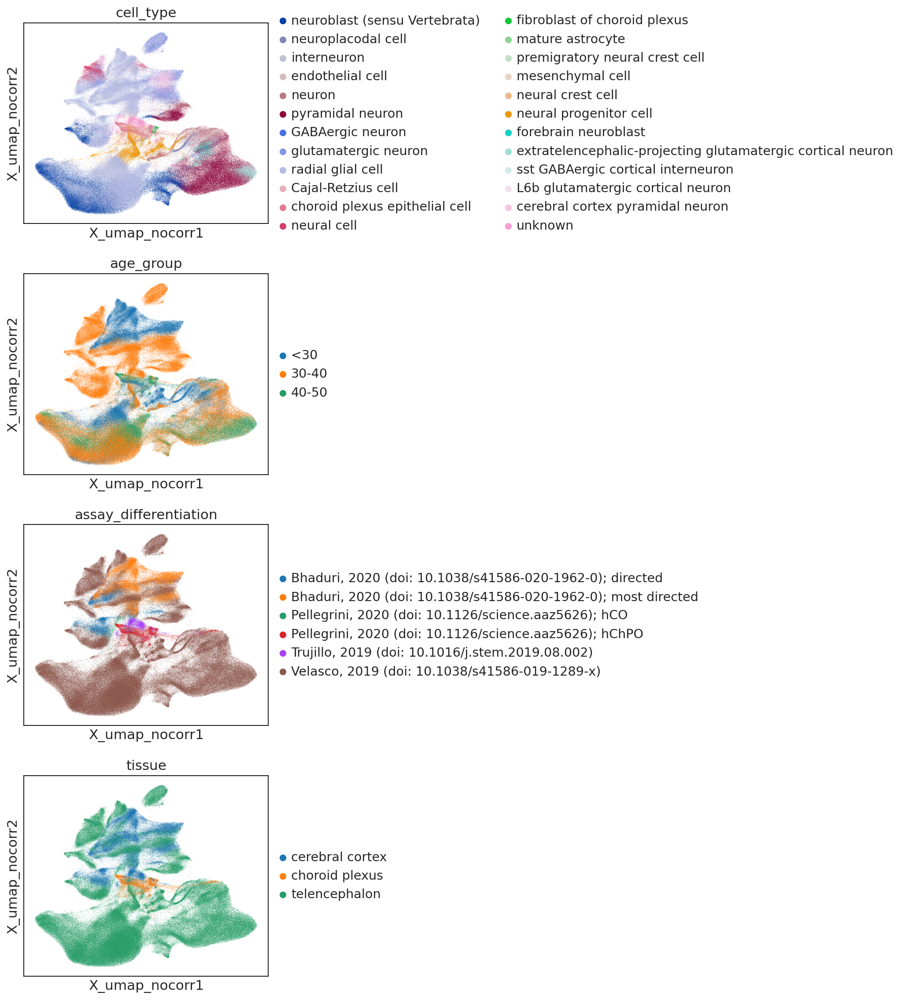

In [17]:
sc.pl.embedding(adata,  basis="X_umap_nocorr", color=['cell_type', 'age_group', 'assay_differentiation', 'tissue'], ncols=1)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


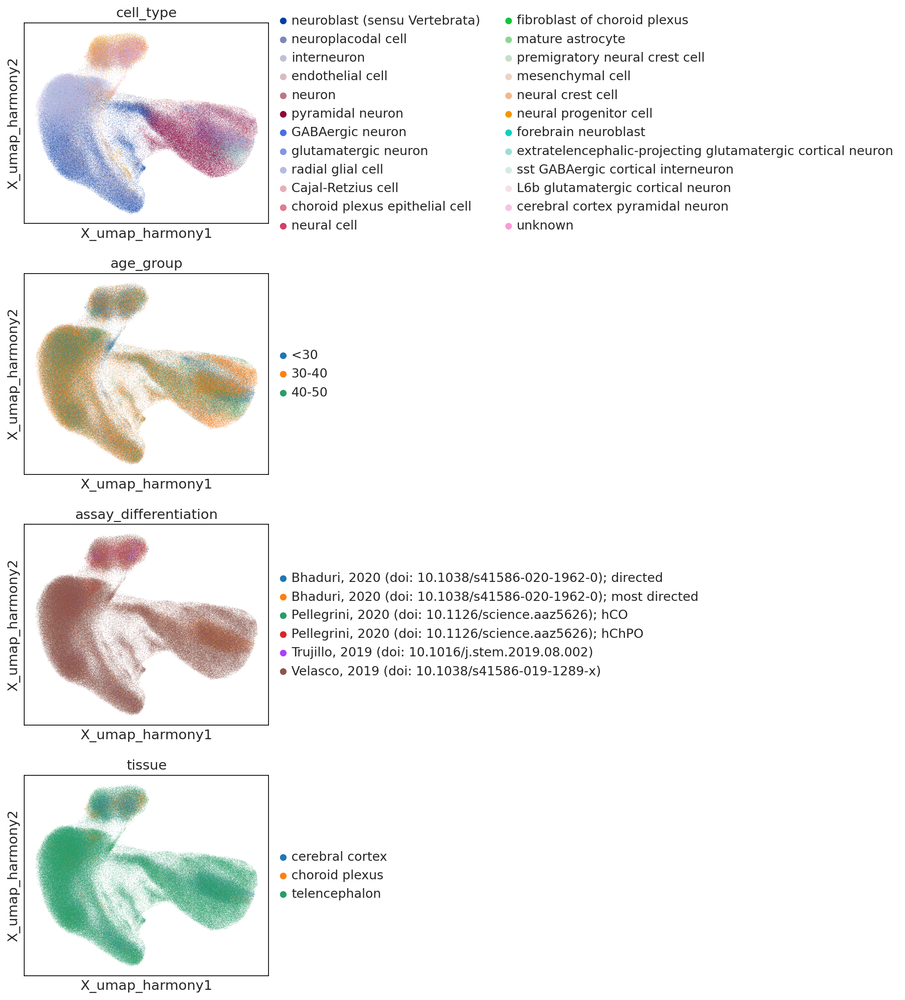

In [18]:
sc.pl.embedding(adata,  basis="X_umap_harmony", color=['cell_type', 'age_group', 'assay_differentiation', 'tissue'], ncols=1)

In [19]:
pd.crosstab(
    adata.obs['age_group'],
    adata.obs['assay_differentiation']
)

assay_differentiation,"Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); directed","Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); most directed","Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hCO","Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hChPO","Trujillo, 2019 (doi: 10.1016/j.stem.2019.08.002)","Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)"
age_group,,,,,,
<30,0,19031,0,3947,0,67217
30-40,13272,9491,2758,0,4427,175844
40-50,0,0,0,5690,0,34350


Dataset is highly unbalanced across protocols and ages (Velasco dominates, especially in 30–40).

To avoid this bias, subsample within each age group, balancing protocols to the smallest group size: <30 → 3947 cells/protocol, 30–40 → 2758, 40–50 → 5690.

This ensures fair representation before Harmony and meta-cell construction.

In [20]:
rng = np.random.default_rng(0)
selected = []

for group in adata.obs['age_group'].cat.categories:
   
    obs_g = adata.obs[adata.obs['age_group'] == group]

    counts = obs_g['assay_differentiation'].value_counts()
    counts = counts[counts > 0]
    n_per_protocol = counts.min()
    print(n_per_protocol)

    for protocol in counts.index:
        idx = obs_g.index[obs_g['assay_differentiation'] == protocol].to_numpy()

        chosen = rng.choice(idx, size=n_per_protocol, replace=False)
        selected.extend(chosen)

adata_sub = adata[adata.obs.index.isin(selected)].copy()

3947
2758
5690


In [21]:
adata_sub

AnnData object with n_obs × n_vars = 37011 × 35725
    obs: 'assay_differentiation', 'assay_type_differentiation', 'bio_sample', 'cell_line', 'cell_type_original', 'gm', 'id', 'individual', 'state_exact', 'suspension_type', 'tech_sample', 'treatment', 'organoid_age_days', 'publication', 'doi', 'batch', 'annot_level_1', 'annot_level_2', 'annot_level_3_rev2', 'annot_level_4_rev2', 'annot_region_rev2', 'annot_ntt_rev2', 'Hallmark_Glycolysis', 'hnoca_core', 'annot_level_2_extended', 'tissue_type', 'sex_ontology_term_id', 'donor_id', 'assay_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'disease_ontology_term_id', 'development_stage_ontology_term_id', 'cell_type_ontology_term_id', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'age_group'
    var: 'gene_length', 'highly_variable', 'highly_variable_rank', 'highly_variable_nbatches', 'feature_is_filtered', 'fe

In [22]:
pd.crosstab(
    adata_sub.obs['age_group'],
    adata_sub.obs['assay_differentiation']
)

assay_differentiation,"Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); directed","Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); most directed","Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hCO","Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hChPO","Trujillo, 2019 (doi: 10.1016/j.stem.2019.08.002)","Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)"
age_group,,,,,,
<30,0,3947,0,3947,0,3947
30-40,2758,2758,2758,0,2758,2758
40-50,0,0,0,5690,0,5690


In [23]:
adata_sub.X = adata_sub.layers['counts'].copy()
sc.pp.normalize_total(adata_sub, target_sum=1e4, exclude_highly_expressed=True)
sc.pp.log1p(adata_sub)
adata_sub.layers['lognorm'] = adata_sub.X.copy()
sc.pp.highly_variable_genes(adata_sub, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key='batch')

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['ENSG00000081051', 'ENSG00000087086', 'ENSG00000111341', 'ENSG00000118137', 'ENSG00000118271', 'ENSG00000137135', 'ENSG00000147437', 'ENSG00000158874', 'ENSG00000160180', 'ENSG00000163220', 'ENSG00000166426', 'ENSG00000167996', 'ENSG00000183395', 'ENSG00000198804', 'ENSG00000205542', 'ENSG00000251562', 'ENSG00000254505']
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:11)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [24]:
sc.tl.pca(adata_sub, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


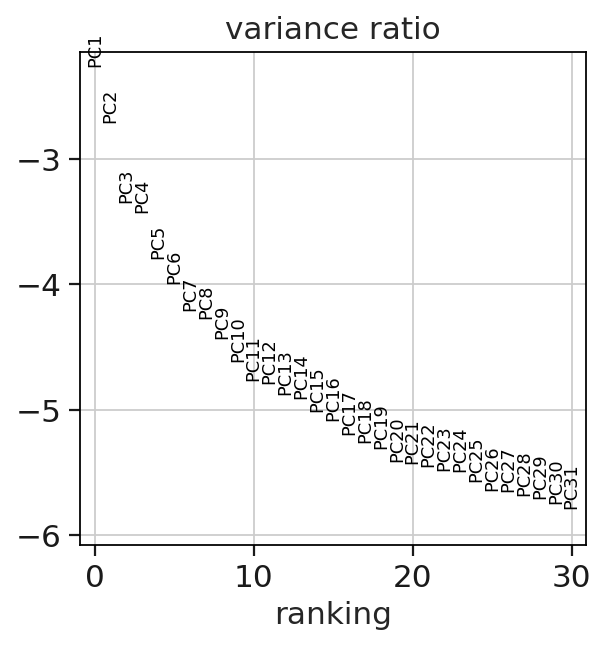

In [25]:
sc.pl.pca_variance_ratio(adata_sub, log=True) 

In [26]:
 N_NB = int(0.5 * len(adata_sub) ** 0.5)
if N_NB > 100:
    N_NB = 100
print(N_NB) 

96


In [27]:
sc.pp.neighbors(adata_sub, n_neighbors=N_NB, n_pcs=20, key_added="pca") 

computing neighbors
    using 'X_pca' with n_pcs = 20


2026-04-16 13:06:10.789654: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-04-16 13:06:15.108325: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-04-16 13:06:20.126027: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


    finished: added to `.uns['pca']`
    `.obsp['pca_distances']`, distances for each pair of neighbors
    `.obsp['pca_connectivities']`, weighted adjacency matrix (0:01:22)


In [28]:
sc.tl.umap(adata_sub, random_state=1, neighbors_key="pca")
# store coordinates in a named slot so to avoid confusion with batch-corrected
adata_sub.obsm["X_umap_nocorr"] = adata_sub.obsm["X_umap"].copy()
del adata_sub.obsm["X_umap"]

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:38)


/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


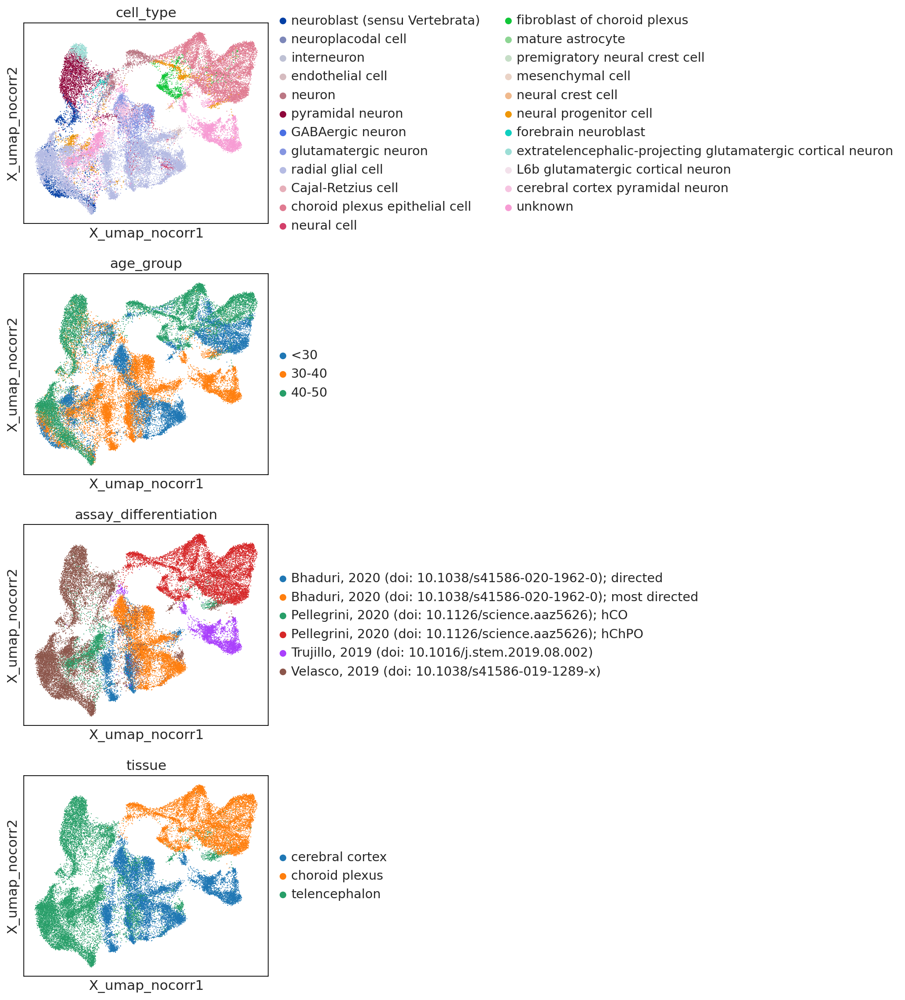

In [29]:
sc.pl.embedding(adata_sub,  basis="X_umap_nocorr", color=['cell_type', 'age_group', 'assay_differentiation', 'tissue'], ncols=1)

In [30]:
sc.tl.draw_graph(adata_sub, random_state=1, neighbors_key="pca")
adata_sub.obsm["X_draw_graph_fa_nocorr"] = adata_sub.obsm["X_draw_graph_fa"].copy()
del adata_sub.obsm["X_draw_graph_fa"]

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:05:55)


/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


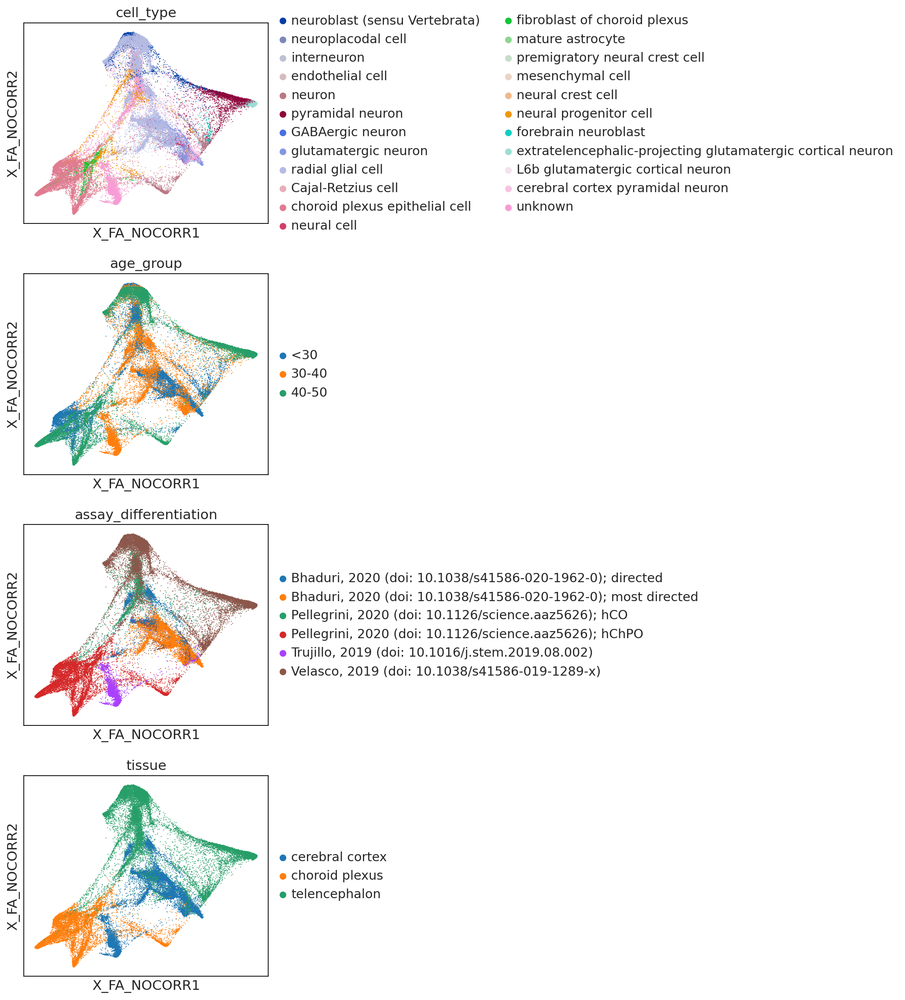

In [31]:
sc.pl.embedding(adata_sub,  basis="X_draw_graph_fa_nocorr", color=['cell_type', 'age_group', 'assay_differentiation', 'tissue'], ncols=1)

In [38]:
sc.external.pp.harmony_integrate(adata_sub, "batch", random_state=5, max_iter_harmony=20)

2026-04-16 13:24:51,963 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-04-16 13:25:03,322 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-04-16 13:25:03,462 - harmonypy - INFO - Iteration 1 of 20
2026-04-16 13:25:21,797 - harmonypy - INFO - Iteration 2 of 20
2026-04-16 13:25:38,462 - harmonypy - INFO - Iteration 3 of 20
2026-04-16 13:25:58,479 - harmonypy - INFO - Iteration 4 of 20
2026-04-16 13:26:18,856 - harmonypy - INFO - Iteration 5 of 20
2026-04-16 13:26:38,556 - harmonypy - INFO - Iteration 6 of 20
2026-04-16 13:26:58,783 - harmonypy - INFO - Iteration 7 of 20
2026-04-16 13:27:19,823 - harmonypy - INFO - Iteration 8 of 20
2026-04-16 13:27:38,242 - harmonypy - INFO - Iteration 9 of 20
2026-04-16 13:27:55,828 - harmonypy - INFO - Iteration 10 of 20
2026-04-16 13:28:11,673 - harmonypy - INFO - Iteration 11 of 20
2026-04-16 13:28:28,319 - harmonypy - INFO - Converged after 11 iterations


In [39]:
sc.pp.neighbors(adata_sub, n_neighbors=N_NB, n_pcs=20, use_rep='X_pca_harmony', key_added='harmony') 

computing neighbors
    finished: added to `.uns['harmony']`
    `.obsp['harmony_distances']`, distances for each pair of neighbors
    `.obsp['harmony_connectivities']`, weighted adjacency matrix (0:00:39)


In [40]:
sc.tl.umap(adata_sub, random_state=1, neighbors_key="harmony")
adata_sub.obsm["X_umap_harmony"] = adata_sub.obsm["X_umap"].copy()
del adata_sub.obsm["X_umap"]

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:40)


/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


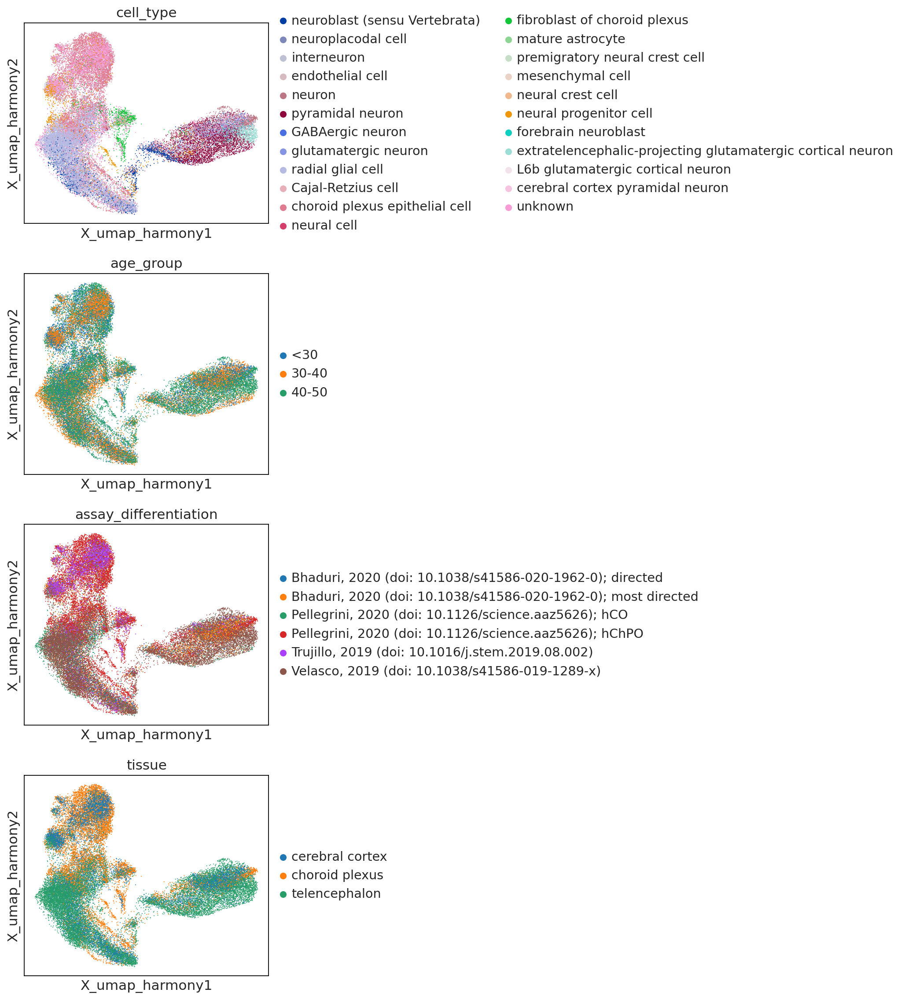

In [41]:
sc.pl.embedding(adata_sub,  basis="X_umap_harmony", color=['cell_type', 'age_group', 'assay_differentiation', 'tissue'], ncols=1)

In [42]:
sc.tl.draw_graph(adata_sub, random_state=1, neighbors_key="harmony")
adata_sub.obsm["X_draw_graph_fa_harmony"] = adata_sub.obsm["X_draw_graph_fa"].copy()
del adata_sub.obsm["X_draw_graph_fa"]

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:07:15)


/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


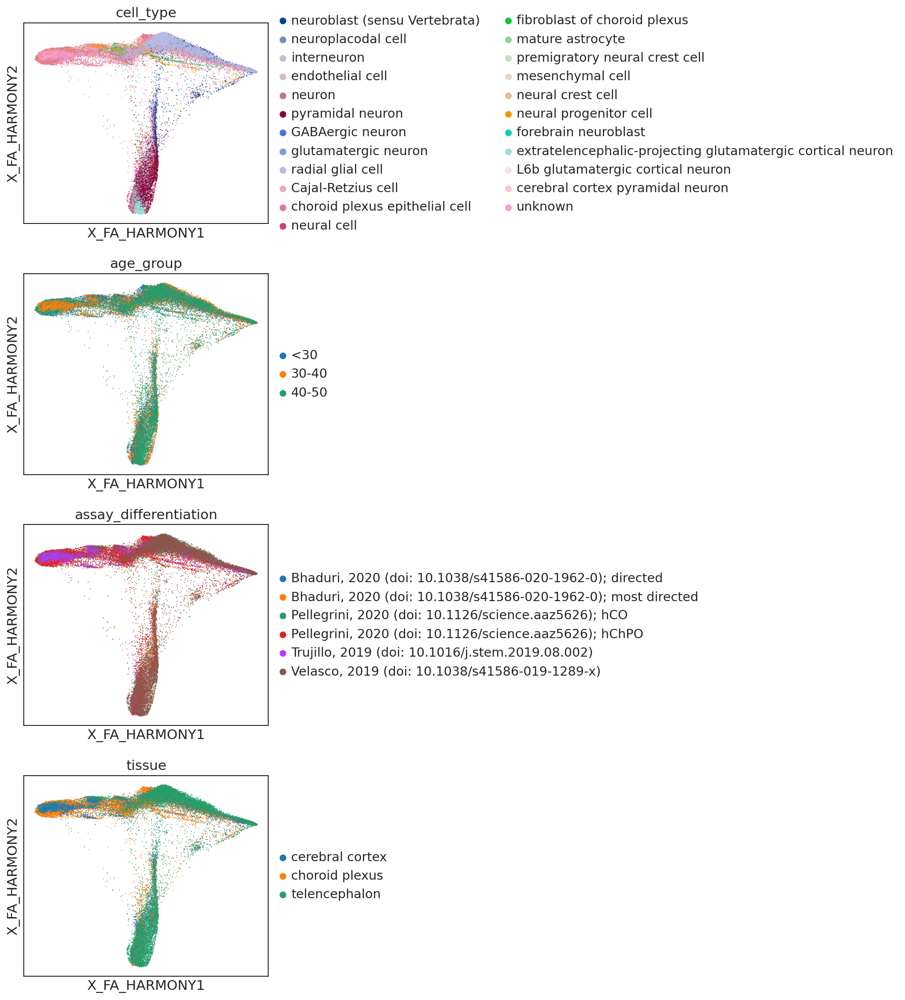

In [51]:
sc.pl.embedding(adata_sub,  basis="X_draw_graph_fa_harmony", color=['cell_type', 'age_group', 'assay_differentiation', 'tissue'], ncols=1)

----------------

# 3. Saving


## 3.1 Save Downsampled Adata

In [43]:
adata_sub

AnnData object with n_obs × n_vars = 37011 × 35725
    obs: 'assay_differentiation', 'assay_type_differentiation', 'bio_sample', 'cell_line', 'cell_type_original', 'gm', 'id', 'individual', 'state_exact', 'suspension_type', 'tech_sample', 'treatment', 'organoid_age_days', 'publication', 'doi', 'batch', 'annot_level_1', 'annot_level_2', 'annot_level_3_rev2', 'annot_level_4_rev2', 'annot_region_rev2', 'annot_ntt_rev2', 'Hallmark_Glycolysis', 'hnoca_core', 'annot_level_2_extended', 'tissue_type', 'sex_ontology_term_id', 'donor_id', 'assay_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'disease_ontology_term_id', 'development_stage_ontology_term_id', 'cell_type_ontology_term_id', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'age_group'
    var: 'gene_length', 'highly_variable', 'highly_variable_rank', 'highly_variable_nbatches', 'feature_is_filtered', 'fe

In [44]:
adata_sub.X

<37011x35725 sparse matrix of type '<class 'numpy.float32'>'
	with 77942350 stored elements in Compressed Sparse Row format>

In [48]:
adata_sub.write(output_file)

## 3.2 Save in other formats

In [49]:
%%bash

# save also html and python versions for git
jupyter nbconvert 3.1SEACellsHNOCA_age_DataPrep.ipynb --to="python" --output="3.1SEACellsHNOCA_age_DataPrep"
jupyter nbconvert 3.1SEACellsHNOCA_age_DataPrep.ipynb --to="html" --output="3.1SEACellsHNOCA_age_DataPrep"

[NbConvertApp] Converting notebook 3.1SEACellsHNOCA_age_DataPrep.ipynb to python
[NbConvertApp] Writing 7166 bytes to 3.1SEACellsHNOCA_age_DataPrep.py
[NbConvertApp] Converting notebook 3.1SEACellsHNOCA_age_DataPrep.ipynb to html
[NbConvertApp] Writing 12567793 bytes to 3.1SEACellsHNOCA_age_DataPrep.html


## 3.3 Finished computations: timestamp

In [50]:
print(datetime.now())

2026-04-16 13:37:37.647492
